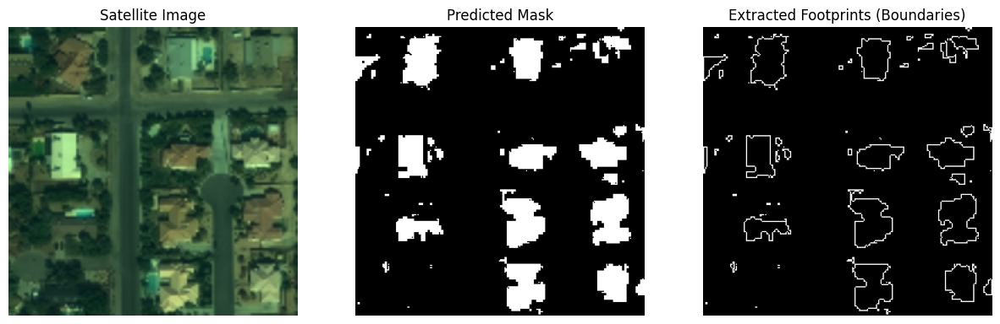

In [30]:
import numpy as np
import rasterio
from rasterio.features import shapes
import geopandas as gpd
from shapely.geometry import shape

# Function to convert binary mask to vectorized polygons
def mask_to_polygons(mask, transform):
    results = (
        {'properties': {'class': v}, 'geometry': s}
        for i, (s, v) in enumerate(shapes(mask, mask=None, transform=transform))
    )
    geoms = list(results)
    return geoms

# Convert predicted masks to polygons
vectorized_footprints = []
for i, pred_mask in enumerate(predicted_masks):
    transform = from_bounds(0, 0, 256, 256, 256, 256)  # Adjust bounds as needed
    geoms = mask_to_polygons(pred_mask.squeeze(), transform)

    # Create a GeoDataFrame
    gdf = gpd.GeoDataFrame.from_features(geoms)
    gdf.crs = "EPSG:4326"  # Set coordinate reference system (adjust if needed)

    # Save as GeoJSON
    gdf.to_file(f"footprint_vector_{i}.geojson", driver="GeoJSON")
    vectorized_footprints.append(gdf)

import cv2
import numpy as np
import matplotlib.pyplot as plt

# Example predicted mask (binary)
predicted_mask = predicted_masks[0, :, :, 0]  # Assuming predicted_masks is already defined

# Convert the predicted mask to uint8 format (required by OpenCV)
predicted_mask = (predicted_mask * 255).astype(np.uint8)

# Find contours in the binary mask
contours, _ = cv2.findContours(predicted_mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the contours
boundary_image = np.zeros_like(predicted_mask)

# Draw the contours on the blank image
cv2.drawContours(boundary_image, contours, -1, 255, thickness=1)  # Thickness=1 ensures thin boundaries

# Display the original image, predicted mask, and extracted boundaries
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Satellite Image")
plt.imshow(X_test[0])
plt.axis('off')

plt.subplot(1, 3, 2)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap='gray')
plt.axis('off')

plt.subplot(1, 3, 3)
plt.title("Extracted Footprints (Boundaries)")
plt.imshow(boundary_image, cmap='gray')
plt.axis('off')

plt.show()

In [31]:
import rasterio

# Load the ground truth mask for the first test image
ground_truth_mask = rasterio.open(test_mask_paths[0]).read(1)  # Read single band

import cv2
import numpy as np

# Convert the ground truth mask to uint8 format
ground_truth_mask_uint8 = (ground_truth_mask * 255).astype(np.uint8)

# Find contours in the ground truth mask
gt_contours, _ = cv2.findContours(ground_truth_mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the ground truth boundaries
gt_boundary_image = np.zeros_like(ground_truth_mask_uint8)
cv2.drawContours(gt_boundary_image, gt_contours, -1, 255, thickness=1)  # Thickness=1 ensures thin boundaries

array([[  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0],
       ...,
       [255, 255,   0, ...,   0,   0,   0],
       [255,   0,   0, ...,   0,   0,   0],
       [  0,   0,   0, ...,   0,   0,   0]], dtype=uint8)

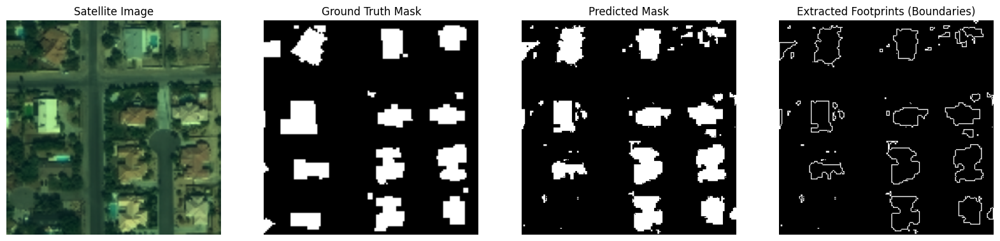

In [32]:
import matplotlib.pyplot as plt

# Display all four components
plt.figure(figsize=(20, 5))

# Satellite Image
plt.subplot(1, 4, 1)
plt.title("Satellite Image")
plt.imshow(X_test[0])  # Assuming X_test contains the preprocessed satellite images
plt.axis('off')

# Ground Truth Mask
plt.subplot(1, 4, 2)
plt.title("Ground Truth Mask")
plt.imshow(ground_truth_mask, cmap='gray')
plt.axis('off')

# Predicted Mask
plt.subplot(1, 4, 3)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap='gray')  # Assuming predicted_mask is already defined
plt.axis('off')

# Extracted Footprints (Boundaries)
plt.subplot(1, 4, 4)
plt.title("Extracted Footprints (Boundaries)")
plt.imshow(boundary_image, cmap='gray')  # Assuming boundary_image is already defined
plt.axis('off')

plt.show()

In [33]:
import cv2

# Save the ground truth mask
cv2.imwrite("ground_truth_mask.tif", ground_truth_mask_uint8)

# Save the predicted mask
cv2.imwrite("predicted_mask.tif", predicted_mask)

# Save the extracted footprints (boundaries)
cv2.imwrite("extracted_footprints.tif", boundary_image)

import rasterio
import numpy as np

# Load the satellite image
satellite_image = X_test[0]  # Assuming X_test contains the preprocessed satellite images

# Load the ground truth mask for the first test image
ground_truth_mask = rasterio.open(test_mask_paths[0]).read(1)  # Read single band

# Load the predicted mask for the first test image
predicted_mask = predicted_masks[0, :, :, 0]  # Assuming predicted_masks is already defined


import cv2

# Convert masks to uint8 format for OpenCV
ground_truth_mask_uint8 = (ground_truth_mask * 255).astype(np.uint8)
predicted_mask_uint8 = (predicted_mask * 255).astype(np.uint8)

# Find contours in the ground truth mask
gt_contours, _ = cv2.findContours(ground_truth_mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the ground truth boundaries
gt_boundary_image = np.zeros_like(ground_truth_mask_uint8)
cv2.drawContours(gt_boundary_image, gt_contours, -1, 255, thickness=1)  # Thickness=1 ensures thin boundaries

# Find contours in the predicted mask
pred_contours, _ = cv2.findContours(predicted_mask_uint8, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Create a blank image to draw the predicted boundaries
pred_boundary_image = np.zeros_like(predicted_mask_uint8)
cv2.drawContours(pred_boundary_image, pred_contours, -1, 255, thickness=1)  # Thickness=1 ensures thin boundaries

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

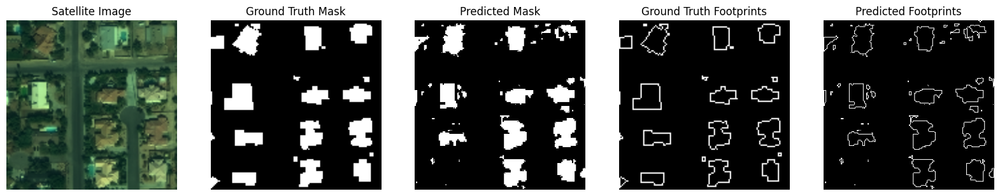

In [34]:
import matplotlib.pyplot as plt

# Display all five components
plt.figure(figsize=(20, 5))

# Satellite Image
plt.subplot(1, 5, 1)
plt.title("Satellite Image")
plt.imshow(satellite_image)
plt.axis('off')

# Ground Truth Mask
plt.subplot(1, 5, 2)
plt.title("Ground Truth Mask")
plt.imshow(ground_truth_mask, cmap='gray')
plt.axis('off')

# Predicted Mask
plt.subplot(1, 5, 3)
plt.title("Predicted Mask")
plt.imshow(predicted_mask, cmap='gray')
plt.axis('off')

# Ground Truth Footprints
plt.subplot(1, 5, 4)
plt.title("Ground Truth Footprints")
plt.imshow(gt_boundary_image, cmap='gray')
plt.axis('off')

# Predicted Footprints
plt.subplot(1, 5, 5)
plt.title("Predicted Footprints")
plt.imshow(pred_boundary_image, cmap='gray')
plt.axis('off')

plt.show()

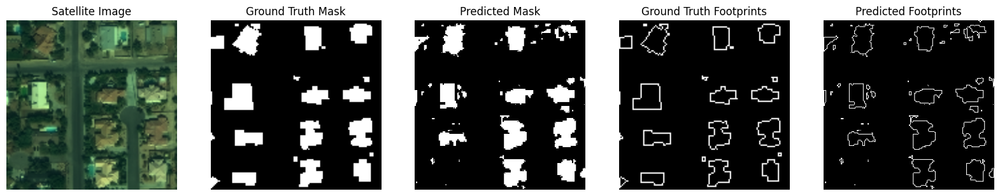

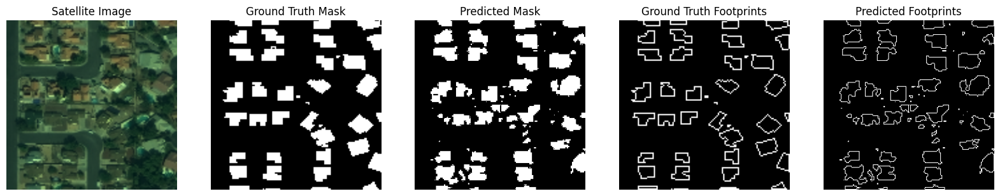

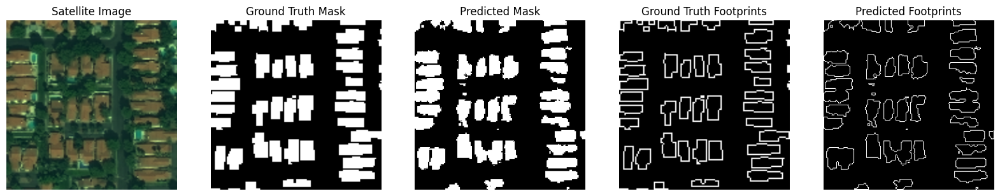

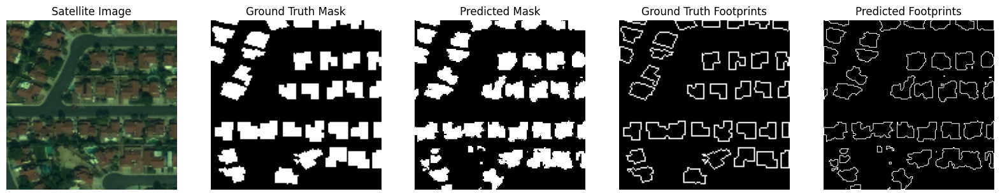

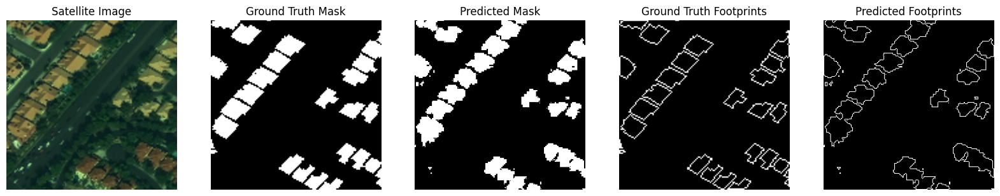

...

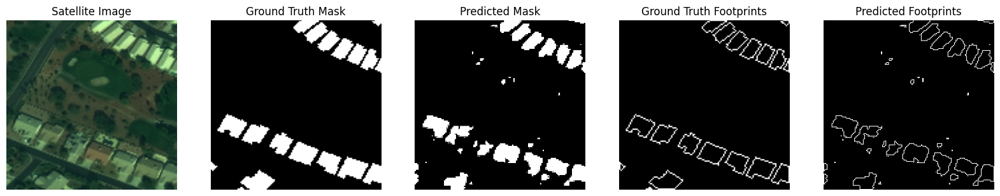

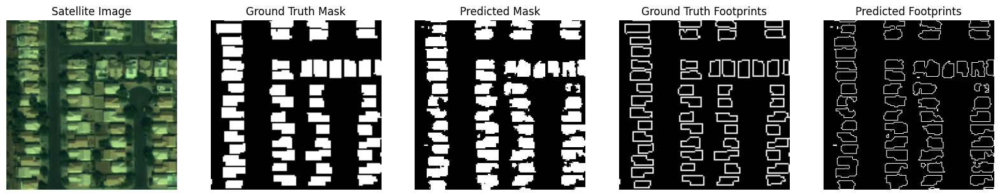

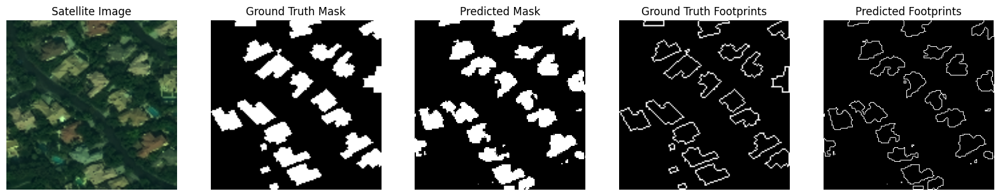

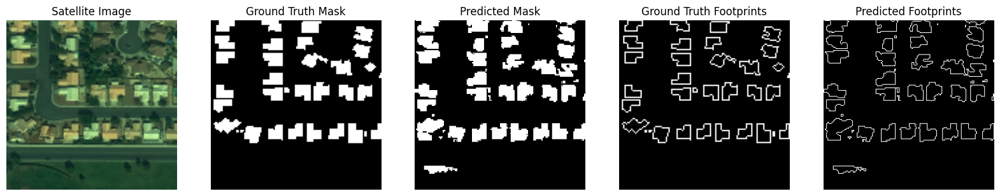

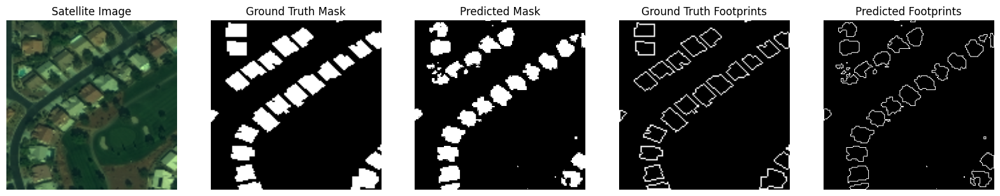

In [35]:
import matplotlib.pyplot as plt

# Display all test images
for i in range(len(X_test)):
    # Get the current test image and its corresponding masks
    satellite_image = X_test[i]
    ground_truth_mask = rasterio.open(test_mask_paths[i]).read(1)
    predicted_mask = predicted_masks[i, :, :, 0]

    # Extract contours for ground truth and predicted masks
    gt_contours, _ = cv2.findContours((ground_truth_mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    pred_contours, _ = cv2.findContours((predicted_mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create blank images to draw contours
    gt_boundary_image = np.zeros_like(ground_truth_mask)
    pred_boundary_image = np.zeros_like(predicted_mask)

    # Draw contours on blank images
    cv2.drawContours(gt_boundary_image, gt_contours, -1, 255, thickness=1)
    cv2.drawContours(pred_boundary_image, pred_contours, -1, 255, thickness=1)

    # Display all five components for the current image
    plt.figure(figsize=(20, 5))

    # Satellite Image
    plt.subplot(1, 5, 1)
    plt.title("Satellite Image")
    plt.imshow(satellite_image)
    plt.axis('off')

    # Ground Truth Mask
    plt.subplot(1, 5, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(ground_truth_mask, cmap='gray')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1, 5, 3)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

    # Ground Truth Footprints
    plt.subplot(1, 5, 4)
    plt.title("Ground Truth Footprints")
    plt.imshow(gt_boundary_image, cmap='gray')
    plt.axis('off')

    # Predicted Footprints
    plt.subplot(1, 5, 5)
    plt.title("Predicted Footprints")
    plt.imshow(pred_boundary_image, cmap='gray')
    plt.axis('off')

    plt.show()

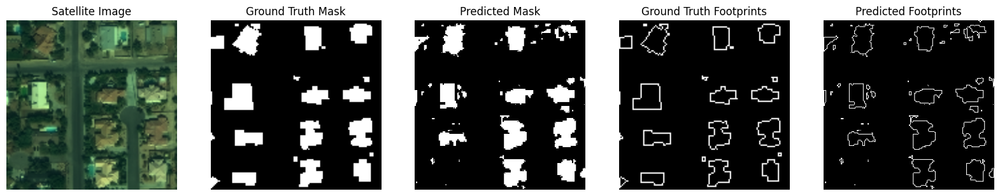

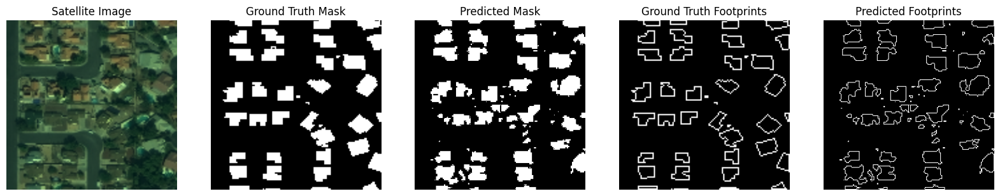

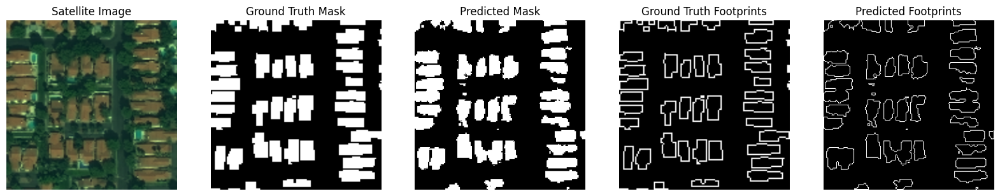

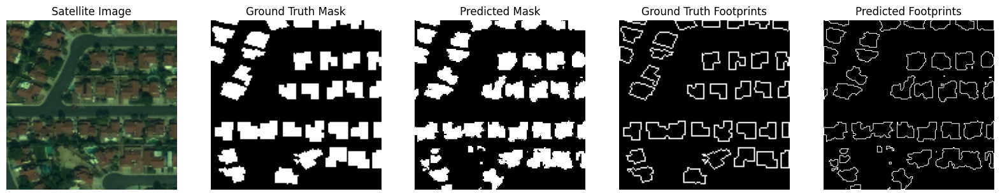

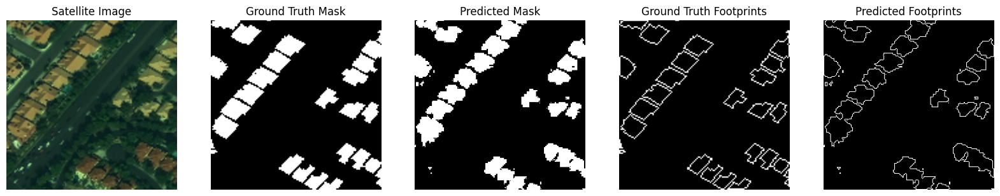

...

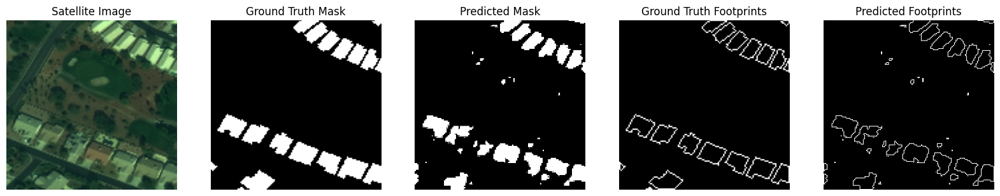

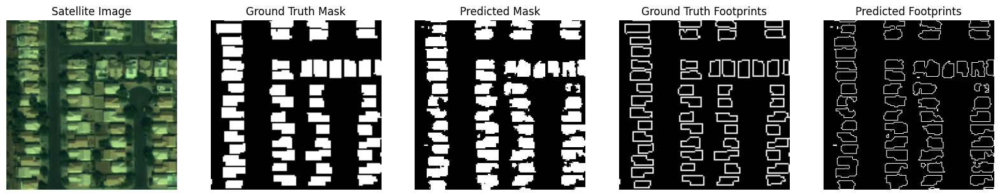

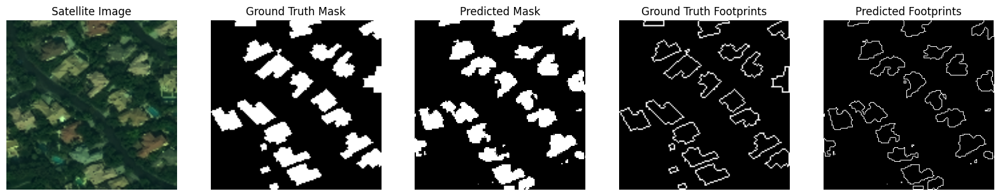

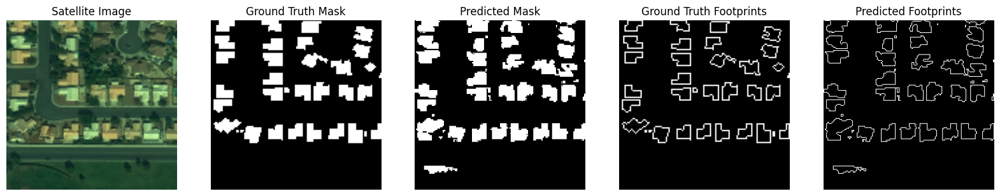

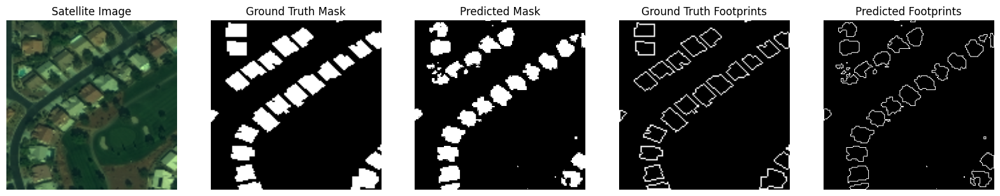

In [36]:
import warnings
import numpy as np
import matplotlib.pyplot as plt
import cv2
import rasterio
from rasterio.transform import from_bounds

# Suppress the warning
warnings.filterwarnings("ignore", category=rasterio.errors.NotGeoreferencedWarning)

# Display all test images
for i in range(len(X_test)):
    # Get the current test image and its corresponding masks
    satellite_image = X_test[i]
    ground_truth_mask = rasterio.open(test_mask_paths[i]).read(1)
    predicted_mask = predicted_masks[i, :, :, 0]

    # Extract contours for ground truth and predicted masks
    gt_contours, _ = cv2.findContours((ground_truth_mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    pred_contours, _ = cv2.findContours((predicted_mask * 255).astype(np.uint8), cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

    # Create blank images to draw contours
    gt_boundary_image = np.zeros_like(ground_truth_mask)
    pred_boundary_image = np.zeros_like(predicted_mask)

    # Draw contours on blank images
    cv2.drawContours(gt_boundary_image, gt_contours, -1, 255, thickness=1)
    cv2.drawContours(pred_boundary_image, pred_contours, -1, 255, thickness=1)

    # Display all five components for the current image
    plt.figure(figsize=(20, 5))

    # Satellite Image
    plt.subplot(1, 5, 1)
    plt.title("Satellite Image")
    plt.imshow(satellite_image)
    plt.axis('off')

    # Ground Truth Mask
    plt.subplot(1, 5, 2)
    plt.title("Ground Truth Mask")
    plt.imshow(ground_truth_mask, cmap='gray')
    plt.axis('off')

    # Predicted Mask
    plt.subplot(1, 5, 3)
    plt.title("Predicted Mask")
    plt.imshow(predicted_mask, cmap='gray')
    plt.axis('off')

    # Ground Truth Footprints
    plt.subplot(1, 5, 4)
    plt.title("Ground Truth Footprints")
    plt.imshow(gt_boundary_image, cmap='gray')
    plt.axis('off')

    # Predicted Footprints
    plt.subplot(1, 5, 5)
    plt.title("Predicted Footprints")
    plt.imshow(pred_boundary_image, cmap='gray')
    plt.axis('off')

    plt.show()